## Featurization & Training data creation

In [1]:
%matplotlib inline
import os
import cv2
import time
import random
import numpy as np
import pandas as pd
import mediapipe as mp
import matplotlib.pyplot as plt

In [2]:
random.seed(123)
np.random.seed(123)

In [3]:
rng = np.random.default_rng(123)

In [4]:
class Point(object):
  def __init__(self, x=0.0, y=0.0, visibility=0.0):
    self.x = x
    self.y = y
    self.visibility = visibility
  
  def __add__(self, other):
    return Point(self.x+other.x, self.y+other.y, (self.visibility+other.visibility)*0.5)
  
  def __sub__(self, other):
    return Point(self.x-other.x, self.y-other.y, abs(self.visibility+other.visibility)*0.5)
  
  def __mul__(self, num):
    if (type(num) is int) or (type(num) is float):
      return Point(self.x*num, self.y*num, self.visibility)
    raise AttributeError("Multiplication allowed only with scalars")
  
  def __repr__(self):
    return "x=%f  y=%f  visibility=%f" %(self.x, self.y, self.visibility)


In [5]:
point_names = ['NOSE','LEFT_SHOULDER','RIGHT_SHOULDER','LEFT_HIP','RIGHT_HIP','LEFT_ELBOW','RIGHT_ELBOW'
       ,'LEFT_WRIST','RIGHT_WRIST','LEFT_KNEE','RIGHT_KNEE','LEFT_ANKLE','RIGHT_ANKLE',
       'LEFT_FOOT_INDEX','RIGHT_FOOT_INDEX']

In [6]:
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

In [7]:
def _draw_pose(image):
  with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.4, 
                    min_tracking_confidence=0.4) as pose:
    image.flags.writeable = False
    # Make detection
    results = pose.process(image)
    # Recolor back to BGR
    image.flags.writeable = True
    # Render detections
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS,
                        landmark_drawing_spec=mp_drawing_styles.get_default_pose_landmarks_style())
  return image

In [8]:
def _get_frame_landmarks(frame):
  # returns the landmarks if pose is detected in the given image frame array, else None
  with mp_pose.Pose(static_image_mode=True,min_detection_confidence=0.4,min_tracking_confidence=0.4) as pose:
    results = pose.process(frame)
    
  return results.pose_landmarks

In [9]:
def _get_points_coordinates(pose_landmarks, frame_shape):
  # returns the co-ordinates of the points after translational normalization
  h, w = frame_shape[:2]
  lhip, rhip = (pose_landmarks.landmark[mp_pose.PoseLandmark['LEFT_HIP']],
                pose_landmarks.landmark[mp_pose.PoseLandmark['RIGHT_HIP']])
  
  # find the mid-hip coordinates 
  mid_hip = Point((lhip.x+rhip.x)*0.5, (lhip.y+rhip.y)*0.5, (lhip.visibility+rhip.visibility)*0.5)
  points = list()
  for name in point_names:
    point = pose_landmarks.landmark[mp_pose.PoseLandmark[name]]
    points.append(Point((point.x-mid_hip.x)*w, (point.y-mid_hip.y)*h, point.visibility))
  
  return points

In [10]:
# img = cv2.cvtColor(cv2.imread('./resources/data/test_data/jumpingjack.png'), cv2.COLOR_RGB2BGR)
# with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.4, 
#                    min_tracking_confidence=0.4) as pose:
#   results = pose.process(img.copy())

In [11]:
# points = _get_points_coordinates(results.pose_landmarks, img.shape)

In [12]:
# points

In [13]:
# plt.figure(figsize=(10, 8))
# plt.imshow(img)
# plt.plot(l.x, l.y, 'b+')
# plt.plot(n.x, n.y, 'r+')
# plt.plot(r.x, r.y, 'r+')
# plt.xticks([])
# plt.yticks([])

In [14]:
def _get_distance(p1, p2):
  # returns euclidean dist between two points
  p = p1 - p2
  return np.sqrt(p.x**2 + p.y**2)

In [15]:
def _get_angle(p1, p2, p3):
  # returns anti-clockwise angle made by point 2 with point 1 and 3
  ab, bc = p1-p2, p3-p2
  dot_prod = (ab.x*bc.x)+(ab.y*bc.y)
  mod_prod = np.sqrt((ab.x**2+ab.y**2)*(bc.x**2+bc.y**2))
  angle = np.rad2deg(np.arccos(dot_prod/mod_prod))   # in degrees
  
  det = ab.x*bc.y - ab.y*bc.x   # determinant for correct quadrant
  angle = 360-angle if det<0 else angle
  return angle

In [16]:
feature_names = ['d_core_nose', 'd_core_lelbow', 'd_core_relbow', 'd_core_lwrist', 'd_core_rwrist',
            'd_core_lknee', 'd_core_rknee', 'd_core_lankle', 'd_core_rankle', 'd_lshoulder_lwrist', 
            'd_rshoulder_rwrist', 'd_lhip_lelbow', 'd_rhip_relbow', 'd_lshoulder_lknee', 'd_rshoulder_rknee', 
            'd_lhip_lankle', 'd_rhip_rankle', 'd_lknee_lfidx', 'd_rknee_rfidx','d_lwrist_rwrist',
            'd_lelbow_relbow', 'd_lshoulder_rshoulder', 'd_lhip_rhip', 'd_lknee_rknee', #'d_lankle_rankle',
            'a_elbows_neck', 'a_knees_hip', 'a_spine', 'a_core_ground',
            'v_left_up', 'v_left_down', 'v_right_up', 'v_right_down', 'Class', 'SubClass']

In [17]:
def _get_frame_features(frame):
  """   returns the featurized form of the given frame(image array)   """
  pose_landmarks = _get_frame_landmarks(frame)
  features = None
  
  if pose_landmarks is not None:
    # get all the required body points
    (nose, left_shoulder, right_shoulder, left_hip, right_hip, left_elbow, right_elbow, 
     left_wrist, right_wrist, left_knee, right_knee, left_ankle, right_ankle, 
     left_foot_idx, right_foot_idx) = _get_points_coordinates(pose_landmarks, frame.shape)
  
    
    # calculate the torso length which will be used to normalise the distances
    neck = (left_shoulder + right_shoulder)*0.5
    torso_len = (_get_distance(neck, left_hip) + _get_distance(neck, right_hip))*0.5
    
    # find body core - mid-point of line joining mid-shoulder and mid-hips
    mid_hips = (left_hip + right_hip)*0.5
    core = (neck + mid_hips)*0.5
    
    
    # calculate distance features
    dist_feats = np.array([
      # distance of limbs from body core
          _get_distance(core, nose),
          # _get_distance(core, left_shoulder), _get_distance(core, right_shoulder),
          _get_distance(core, left_elbow), _get_distance(core, right_elbow),
          _get_distance(core, left_wrist), _get_distance(core, right_wrist),
          # _get_distance(core, left_hip), _get_distance(core, right_hip),
          _get_distance(core, left_knee), _get_distance(core, right_knee),
          _get_distance(core, left_ankle), _get_distance(core, right_ankle),
      
      # 2-joints distances
          _get_distance(left_shoulder, left_wrist), _get_distance(right_shoulder, right_wrist),
          _get_distance(left_hip, left_elbow), _get_distance(right_hip, right_elbow),
          _get_distance(left_shoulder, left_knee), _get_distance(right_shoulder, right_knee),
          _get_distance(left_hip, left_ankle), _get_distance(right_hip, right_ankle),
          _get_distance(left_knee, left_foot_idx), _get_distance(right_knee, right_foot_idx),
      
      # cross joint distances
          _get_distance(left_wrist, right_wrist), _get_distance(left_elbow, right_elbow),
          _get_distance(left_shoulder, right_shoulder), _get_distance(left_hip, right_hip),
          _get_distance(left_knee, right_knee)  #, _get_distance(left_ankle, right_ankle)
      ])
    # normalise dist features
    dist_feats /= torso_len
    
    # calculate angle features
    ground = Point(core.x, frame.shape[0]-1, 0.9)
    angle_feats = np.array([
      # angles made by neck with both elbows, angles made by hips with both knees,
      # spine angle, and body with respect to ground
        _get_angle(left_elbow, neck, right_elbow), _get_angle(left_knee, mid_hips, right_knee),
        _get_angle(nose, neck, mid_hips), _get_angle(nose, core, ground)
    ])
    angle_feats /= 360.0
    
    visibility_feats = np.array([
      # visibility features of left and right profiles(upper and lower body)
          (left_shoulder.visibility + left_hip.visibility)*0.5,
          (left_hip.visibility + left_knee.visibility)*0.5,
          (right_shoulder.visibility + right_hip.visibility)*0.5,
          (right_hip.visibility + right_knee.visibility)*0.5
      ])
    
    features = np.hstack((dist_feats, angle_feats, visibility_feats))
    
  return features

In [18]:
# path = './resources/data/test_data/'
path = '../app/pics/'

In [19]:
for file in os.listdir(path):
  img_path = os.path.join(path, file)
  if not os.path.isfile(img_path):
    continue
  img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_RGB2BGR)
  
  #with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.4, 
  #                  min_tracking_confidence=0.4) as pose:
  #  results = pose.process(img.copy())
  #print(results.pose_landmarks.landmark[mp_pose.PoseLandmark['LEFT_KNEE']])
  #print(results.pose_landmarks.landmark[mp_pose.PoseLandmark['RIGHT_KNEE']])
  plt.figure(figsize=(10, 8))
  frame = img.copy()
  img = _draw_pose(img)
  feats = _get_frame_features(frame)
  #print(angle_feats*360)
  plt.imshow(img)
  #plt.plot(l.x, l.y, 'b+')
  #plt.plot(n.x, n.y, 'r+')
  #plt.plot(r.x, r.y, 'r+')
  plt.xticks([])
  plt.yticks([])
  plt.show()

In [15]:
# Let's create training data with added Gaussian noise

In [150]:
train_data_path = '../resources/data/train_data/'

In [151]:
comp_feat_ids = set((25,26,27,28))   # angle features, -ve means (360-angle)
def _multiply_data_by_noise(data, target_n=25, to_append=None):
  nfeats = len(data)
  size_mu = np.round(nfeats*0.5)
  sample_sizes = np.rint(rng.normal(loc=size_mu, scale=1.5, size=target_n-1)).astype(int)
  
  data_set = [data.astype(float).tolist()+([] if to_append is None else to_append)]
  for sz in sample_sizes:
    sz = max(sz, 1)
    noise = rng.normal(0, 0.025, nfeats)
    mask_ids = rng.choice(nfeats, sz, replace=False)
    mask_bits = np.zeros_like(noise)
    np.add.at(mask_bits, mask_ids, 1.0)
    delta = np.multiply(data, mask_bits*noise)
    new_data = list()
    for i,n in enumerate(np.add(data, delta).tolist()):
      if n<0:
        if i in comp_feat_ids:
          n = 1-n
        else:
          n = 0.00001
      new_data.append(n)
    
    if to_append is not None:
      new_data.extend(to_append)
    data_set.append(new_data)
  
  return data_set

In [152]:
def _negative_sampling_by_noise(data, target_n=5, to_append=None):
  nfeats = len(data)
  size_mu = np.round(nfeats*0.05)
  sample_sizes = np.rint(rng.normal(loc=size_mu, scale=1.5, size=target_n)).astype(int)
  
  data_set = []
  for sz in sample_sizes:
    sz = max(sz, 1)
    noise = rng.normal(0, 0.05, nfeats)+0.5
    mask_ids = rng.choice(nfeats, sz, replace=False)
    mask_bits = np.zeros_like(noise)
    np.add.at(mask_bits, mask_ids, 1.0)
    delta = np.multiply(data, mask_bits*noise)
    new_data = list()
    for i,n in enumerate(np.add(data, delta).tolist()):
      if n<0:
        if i in comp_feat_ids:
          n = 1-n
        else:
          n = 0.00001
      new_data.append(n)
    
    if to_append is not None:
      new_data.extend(to_append)
    data_set.append(new_data)
  
  return data_set

In [173]:
data_set = list()

In [174]:
for class_file in os.listdir(train_data_path):
  class_path = os.path.join(train_data_path, class_file)
  if os.path.isdir(class_path):
    # print(class_path)
    sub_classes = ['start', 'end', '']
    for sub_class in sub_classes:
      sub_class_path = os.path.join(class_path, sub_class)
      if os.path.isdir(sub_class_path):
        for pose_file in os.listdir(sub_class_path):
          pose_file_path = os.path.join(sub_class_path, pose_file)
          if os.path.isfile(pose_file_path):
            # print("%s - %s - %s" %(pose_file, class_file, class_file if sub_class=='' else sub_class))
            feature_set = list()
            
            img_arr = cv2.cvtColor(cv2.imread(pose_file_path), cv2.COLOR_RGB2BGR)
            feats = _get_frame_features(img_arr)
            #feats = np.append(feats, [class_file, class_file if sub_class=='' else sub_class])
            #feats.extend([class_file, class_file if sub_class=='' else sub_class])
            
            
            feature_set.extend(_multiply_data_by_noise(feats, target_n=25, to_append=[class_file, 
                                                                  class_file if sub_class=='' else sub_class]))
            feature_set.extend(_negative_sampling_by_noise(feats, target_n=10, to_append=['random', 'random']))
            
            # horizontally flip and featurize again
            img_arr = cv2.flip(img_arr, 1)
            feats = _get_frame_features(img_arr)
            # feats.extend([class_file, class_file if sub_class=='' else sub_class])
            feature_set.extend(_multiply_data_by_noise(feats, target_n=25, to_append=[class_file, 
                                                                  class_file if sub_class=='' else sub_class]))
            feature_set.extend(_negative_sampling_by_noise(feats, target_n=10, to_append=['random', 'random']))
            data_set.extend(feature_set)
#             break
#         break
#   break

In [175]:
len(data_set), len(data_set[7])

(3500, 34)

In [176]:
df_dataset = pd.DataFrame(data_set, columns=feature_names)

In [168]:
df_dataset['Class'].value_counts()

planks    50
random    10
Name: Class, dtype: int64

In [169]:
df_dataset[df_dataset['Class']=='planks'].iloc[:, :32].values.shape

(50, 32)

In [170]:
x = np.arange(32).reshape(-1, 32)
y = df_dataset[df_dataset['Class']=='planks'].iloc[:10, :32].values
y_ = df_dataset[df_dataset['Class']=='random'].iloc[:10, :32].values

In [171]:
x.shape, y.shape, y_.shape

((1, 32), (10, 32), (10, 32))

In [114]:
np.tile(x,(10,1)).shape, y.shape

((10, 32), (10, 32))

No handles with labels found to put in legend.


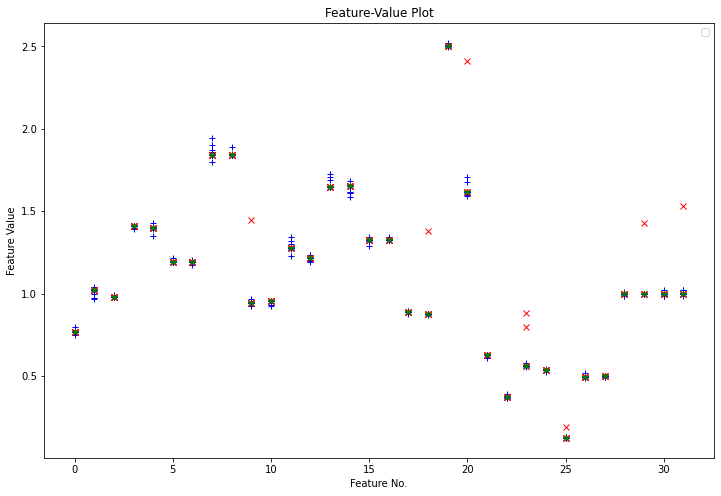

In [119]:
plt.figure(figsize=(12,8))
for i in range(1,10):
  plt.plot(x, y[i:i+1], color='blue', linestyle='dashed', linewidth = 5,
         marker='+')
# , label='Added Positive data'
# , label='Added Negative data'
# , label='Actual data'
for i in range(len(y_)):
  plt.plot(x, y_[i:i+1], color='red', linestyle='dashed', linewidth = 5,
         marker='x')
plt.plot(x, y[:1], color='green', linestyle='dashed', linewidth = 5,
         marker='*')
plt.xlabel('Feature No.')
plt.ylabel('Feature Value')
plt.title('Feature-Value Plot')
plt.legend()
plt.show()

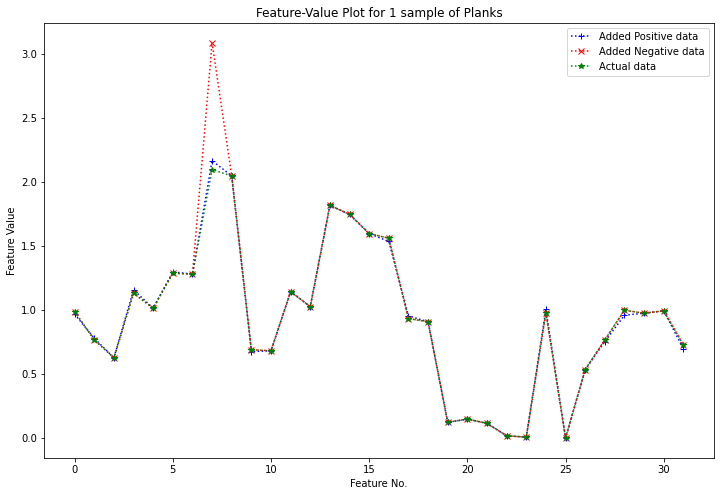

In [172]:
plt.figure(figsize=(12,8))
plt.plot(y[1], color='blue', linestyle='dotted',
       marker='+', label='Added Positive data')
plt.plot(y_[2], color='red', linestyle='dotted',
       marker='x', label='Added Negative data')
plt.plot(y[0], color='green', linestyle='dotted',
       marker='*', label='Actual data')
plt.xlabel('Feature No.')
plt.ylabel('Feature Value')
plt.title('Feature-Value Plot for 1 sample of Planks')
plt.legend()
plt.show()

In [177]:
df_dataset.to_csv('../resources/data/expanded_data_v2.csv', index=False)

In [20]:
from joblib import load

In [21]:
import cv2

class FrameExtractor(object):
  """
    Class to extract frames from a given video at every specific intervals

    Arguments:
      time_interval : time interval of frame capturing in ms (default 100ms)
      debug : print info if debug is true
  """
  def __init__(self, time_interval=100, debug=False):
    self.time_interval = time_interval
    self.debug = debug
  
  def get_frames(self, file_path):
    """
      Returns the frames from video file

      Arguments:
        file_path : path to video file
    """
    try:
      vidObj = cv2.VideoCapture(file_path)
      frames, frame_count = list(), 0
      # start reading video stream
      status, image = vidObj.read()
      while status:
        frame_count += 1
        frames.append(image)
        # set the video time to the corret time as per time_interval
        vidObj.set(cv2.CAP_PROP_POS_MSEC, frame_count*self.time_interval)
        status, image = vidObj.read()
      else:
        if self.debug:
          print("%d frames extracted." %frame_count)

    except Exception as ex:
      frames = None
      print("Error: %s" %str(ex))

    return frames

In [23]:
# xgb_clf = load('./resources/models/single/xgb_clf.model')
# subclas_encoder = load('./resources/models/single/subclas_encoder.model')

clf_subclas = load('../resources/models/cascade/knn_clf.model')
clf_clas = load('../resources/models/cascade/xgb_clf.model')
clas_encoder = load('../resources/models/cascade/clas_encoder.model')
subclas_encoder = load('../resources/models/cascade/subclas_encoder.model')

In [24]:
fex = FrameExtractor(time_interval=100)

In [25]:
user_frames = fex.get_frames('../resources/videos/user_video_webcam.mp4')

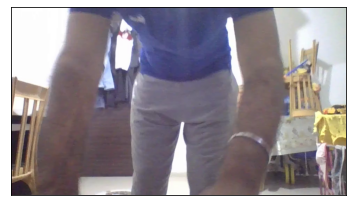

[4] random [7] random-random
--------------------------------------------------
No features
--------------------------------------------------


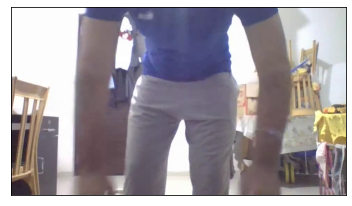

[4] random [7] random-random
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------


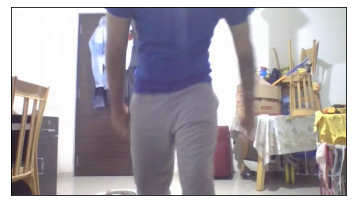

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


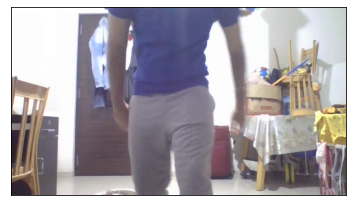

[4] random [7] random-random
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------


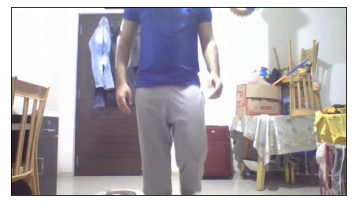

[4] random [7] random-random
--------------------------------------------------


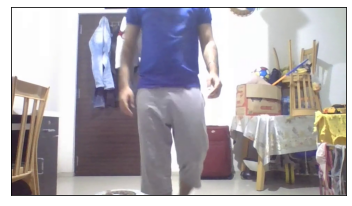

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


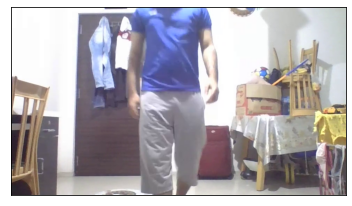

[2] lunges [5] lunges-start
--------------------------------------------------


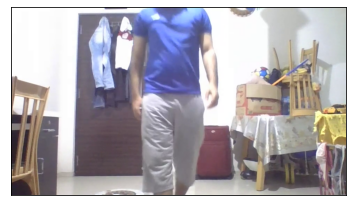

[1] jumping_jacks [5] lunges-start
--------------------------------------------------


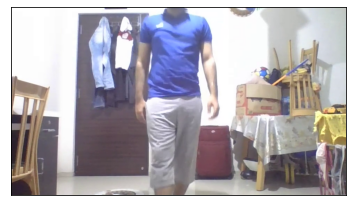

[4] random [7] random-random
--------------------------------------------------


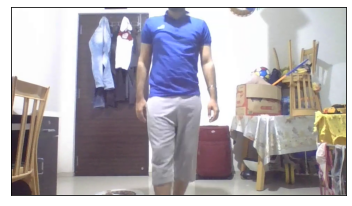

[4] random [7] random-random
--------------------------------------------------


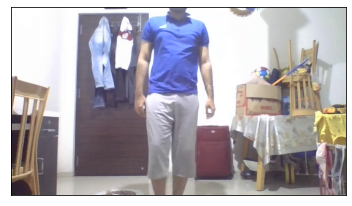

[1] jumping_jacks [5] lunges-start
--------------------------------------------------


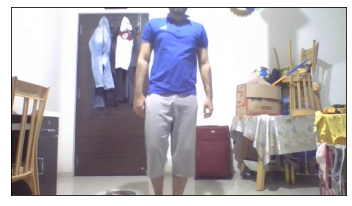

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


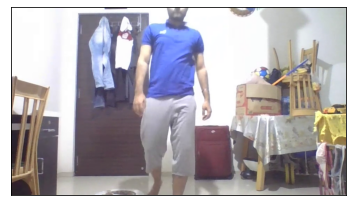

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


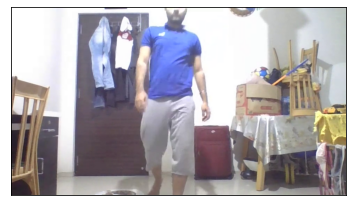

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


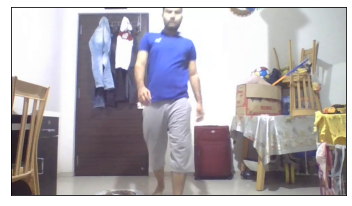

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


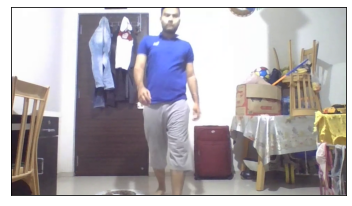

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


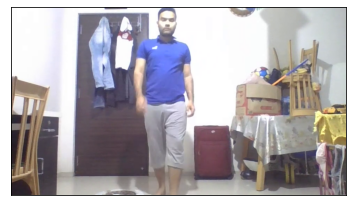

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


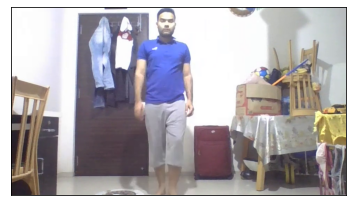

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


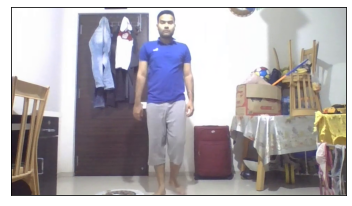

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


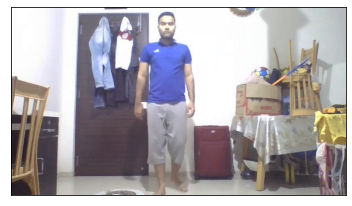

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


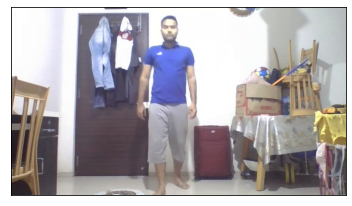

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


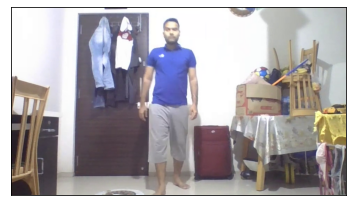

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


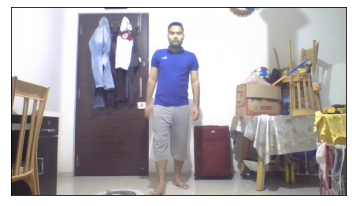

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


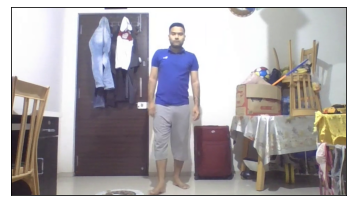

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


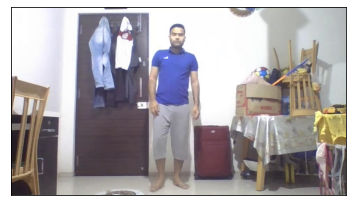

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


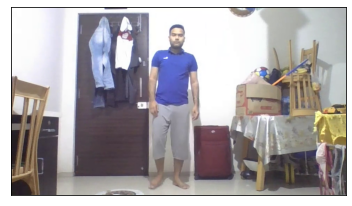

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


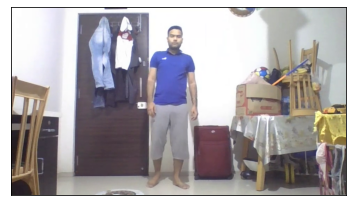

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


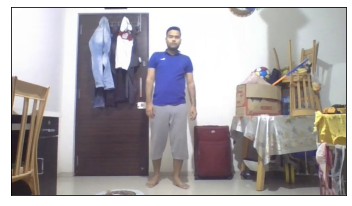

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


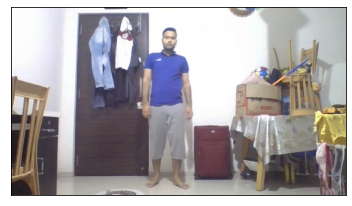

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


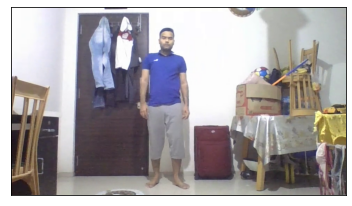

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


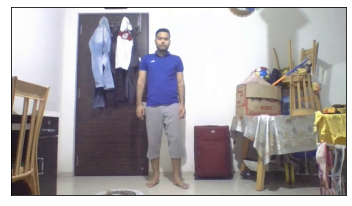

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


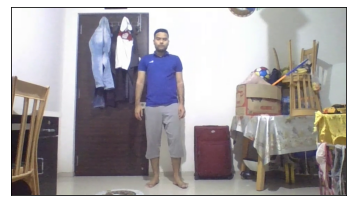

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


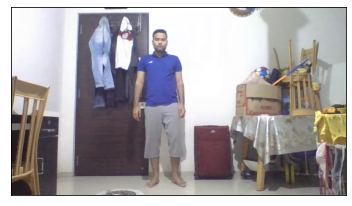

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


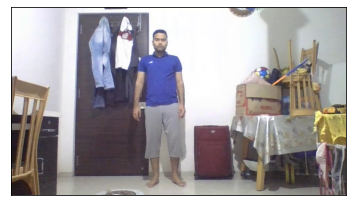

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


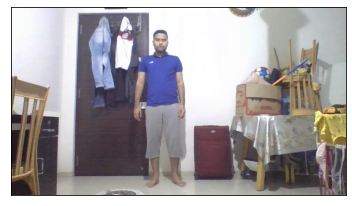

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


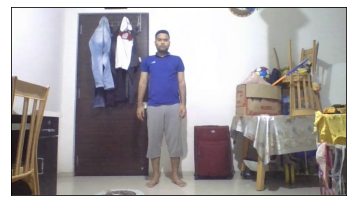

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


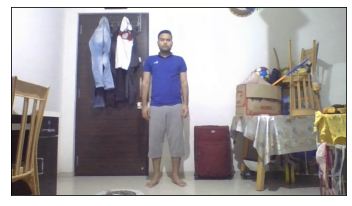

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


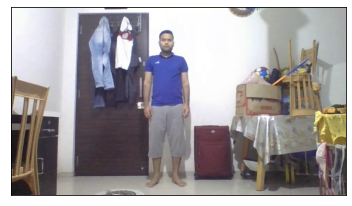

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


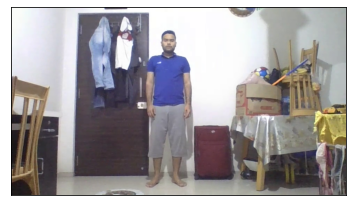

[1] jumping_jacks [5] lunges-start
--------------------------------------------------


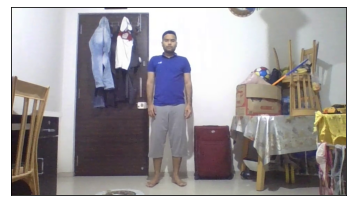

[1] jumping_jacks [5] lunges-start
--------------------------------------------------


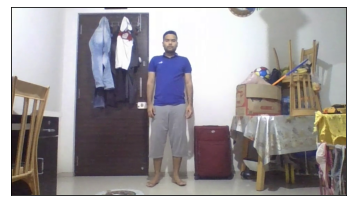

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


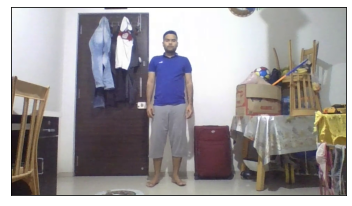

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


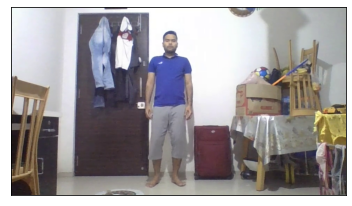

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


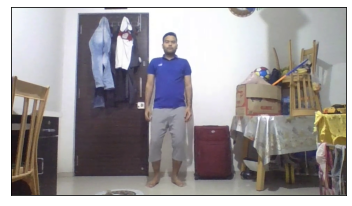

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


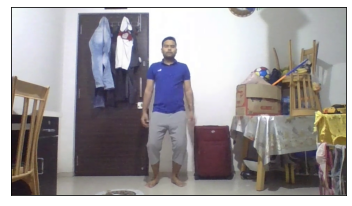

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


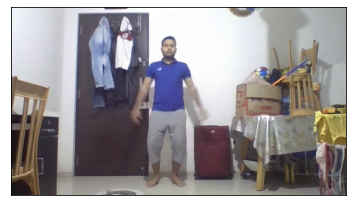

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


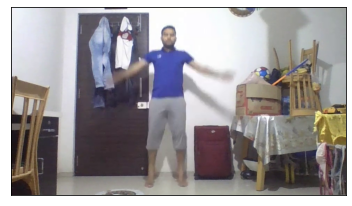

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


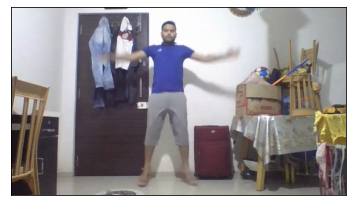

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


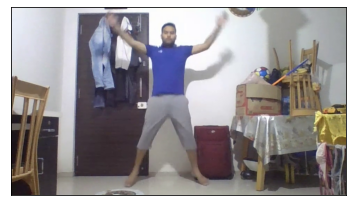

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


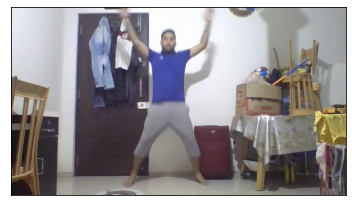

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


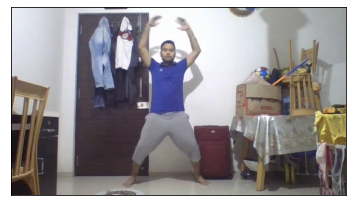

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


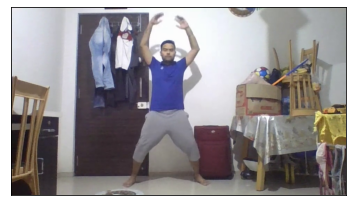

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


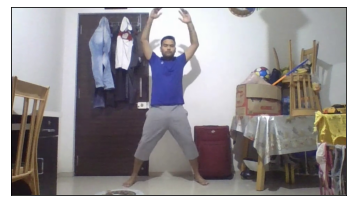

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


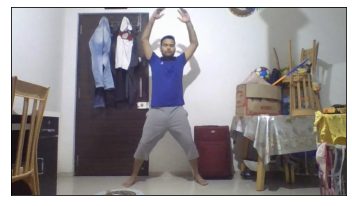

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


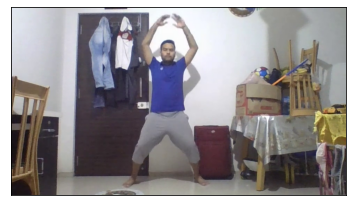

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


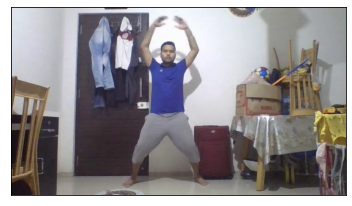

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


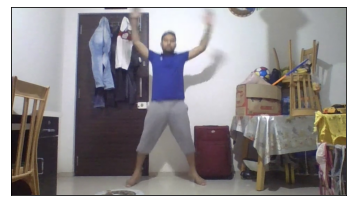

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


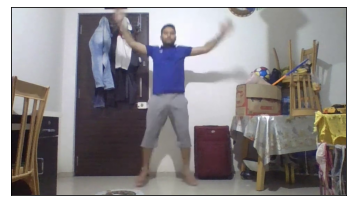

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


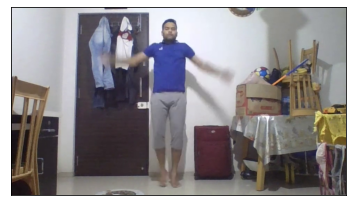

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


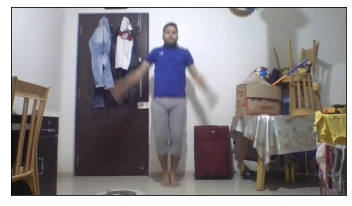

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


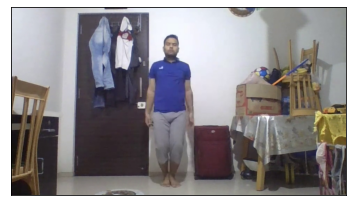

[4] random [7] random-random
--------------------------------------------------


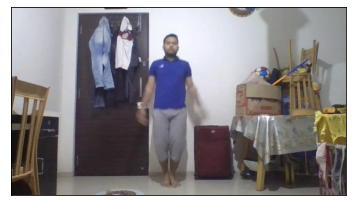

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


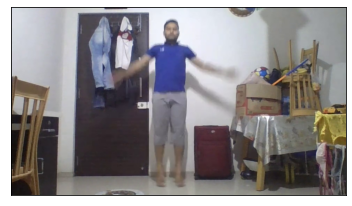

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


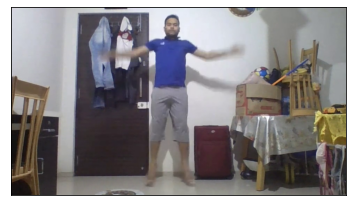

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


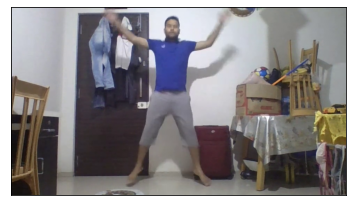

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


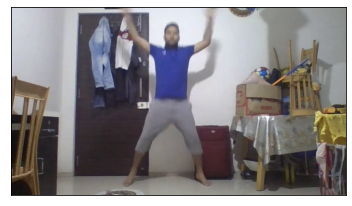

[4] random [7] random-random
--------------------------------------------------


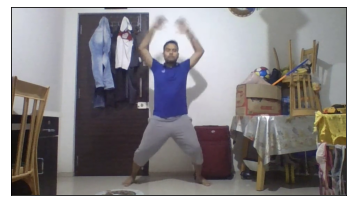

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


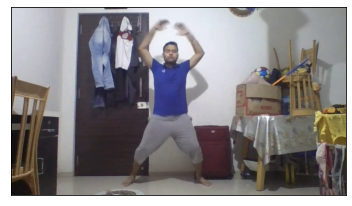

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


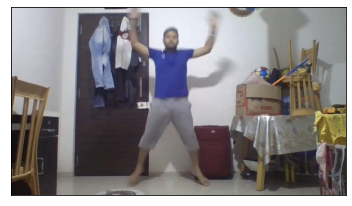

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


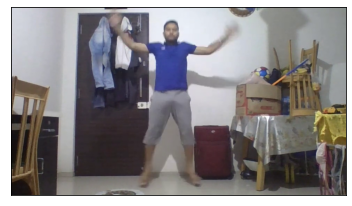

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


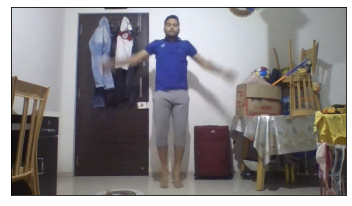

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


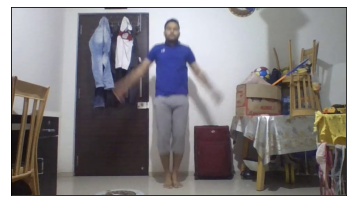

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


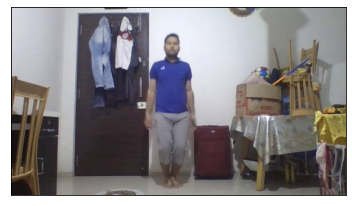

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


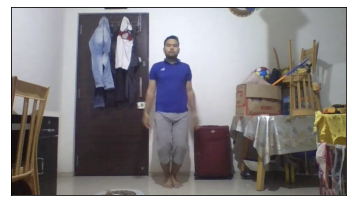

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


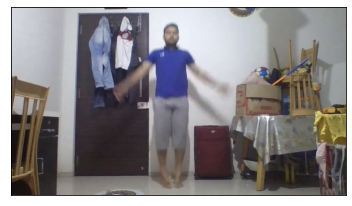

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


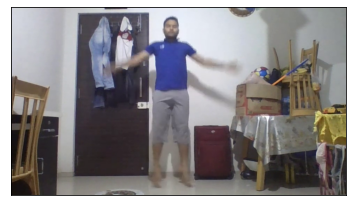

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


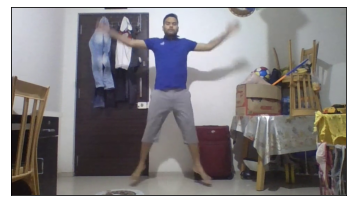

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


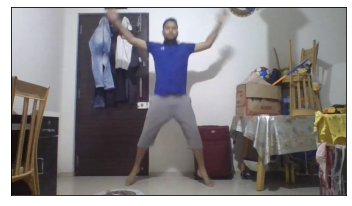

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


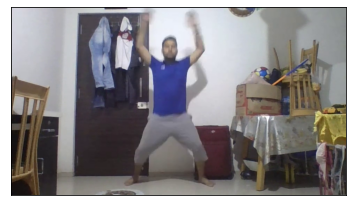

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


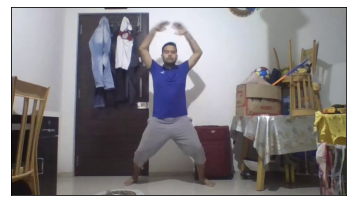

[4] random [7] random-random
--------------------------------------------------


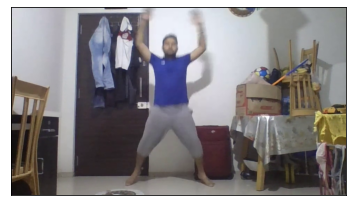

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


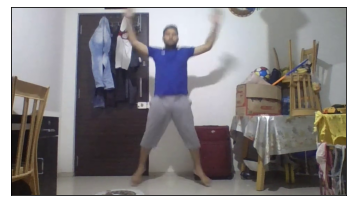

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


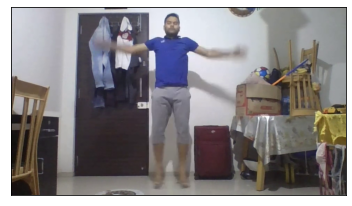

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


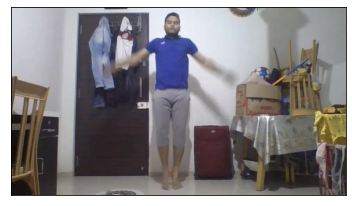

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


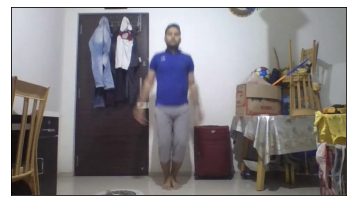

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


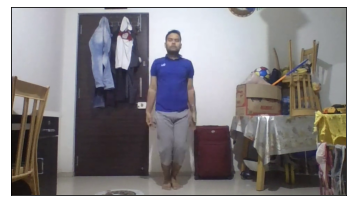

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


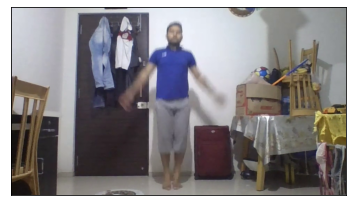

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


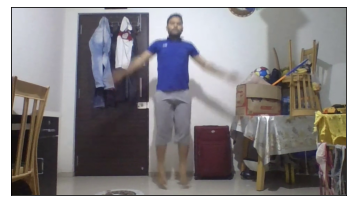

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


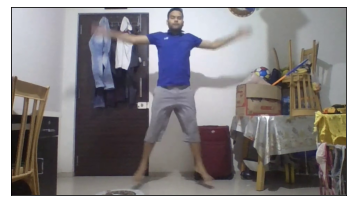

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


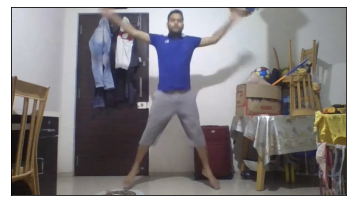

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


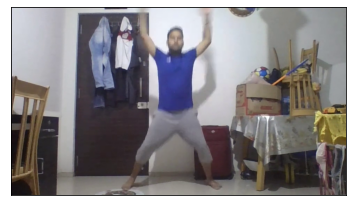

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


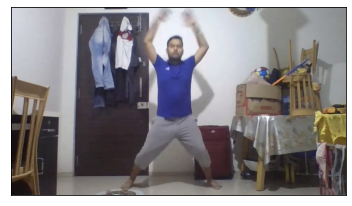

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


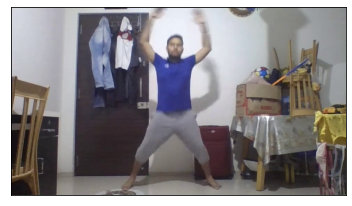

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


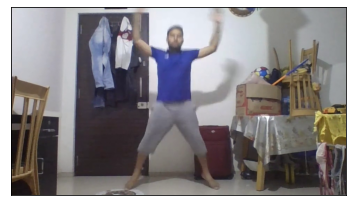

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


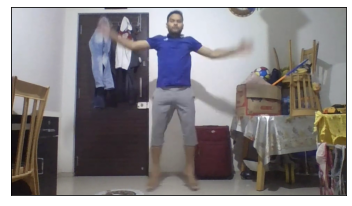

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


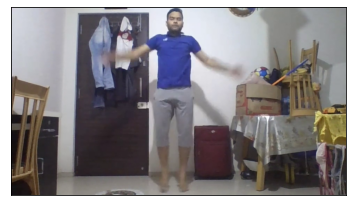

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


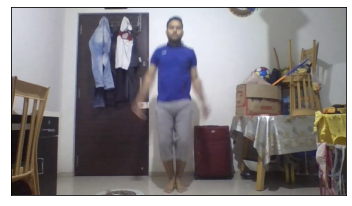

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


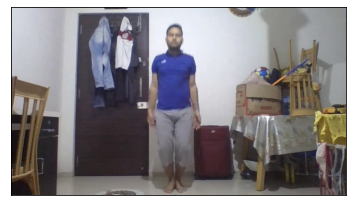

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


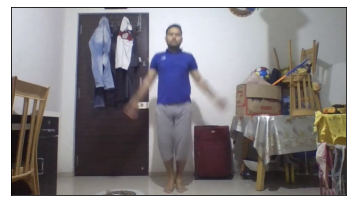

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


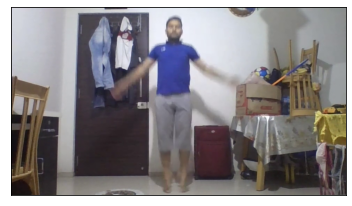

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


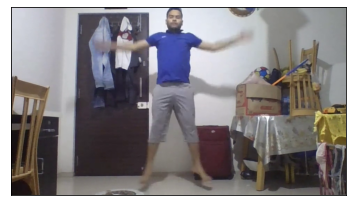

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


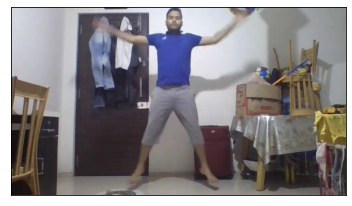

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


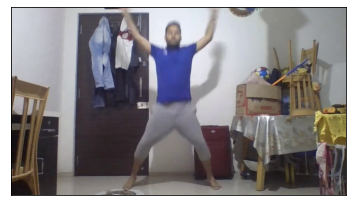

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


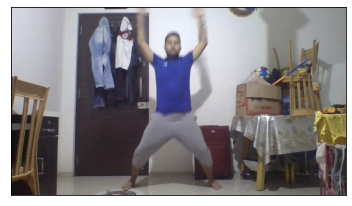

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


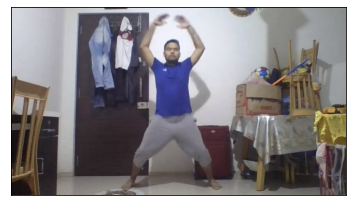

[4] random [7] random-random
--------------------------------------------------


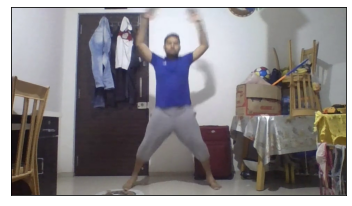

[1] jumping_jacks [2] jumping_jacks-end
--------------------------------------------------


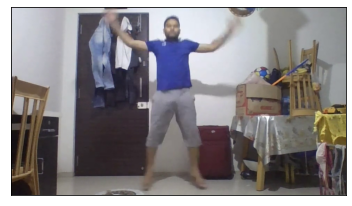

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


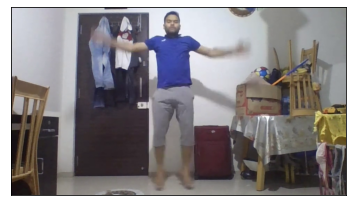

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


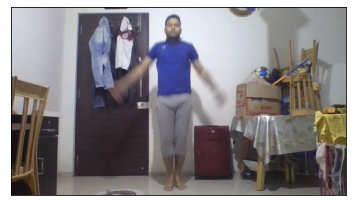

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


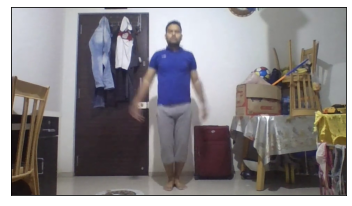

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


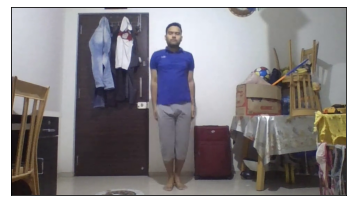

[4] random [7] random-random
--------------------------------------------------


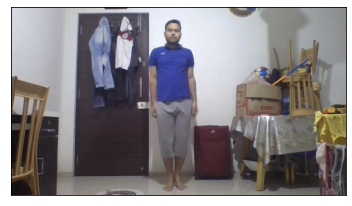

[1] jumping_jacks [5] lunges-start
--------------------------------------------------


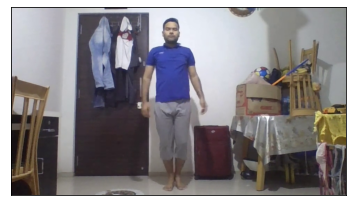

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


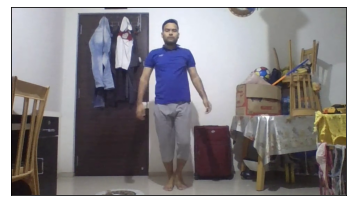

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


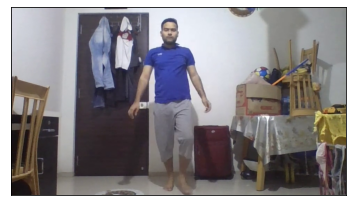

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


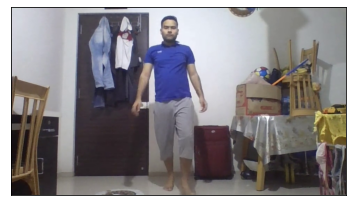

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


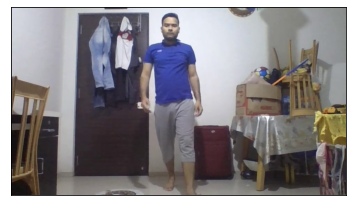

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


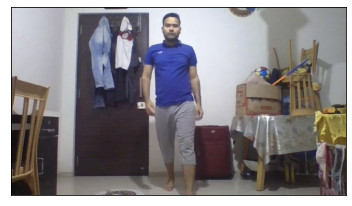

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


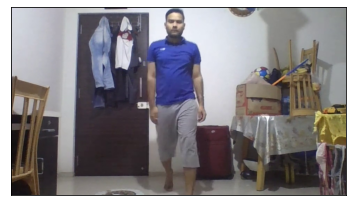

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


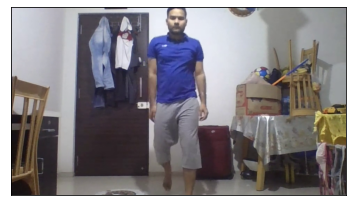

[4] random [7] random-random
--------------------------------------------------


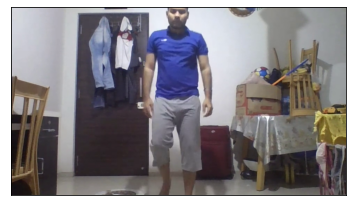

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


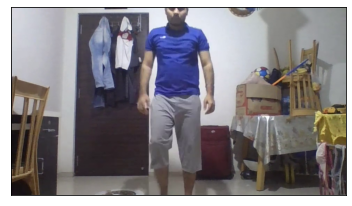

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


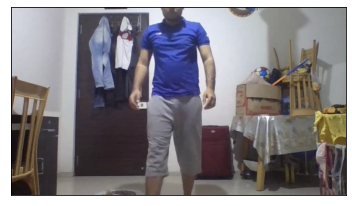

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


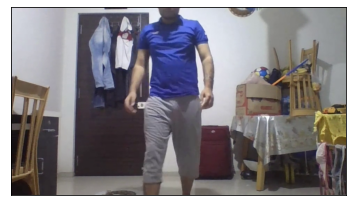

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


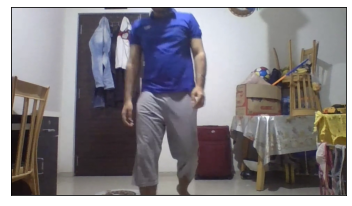

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


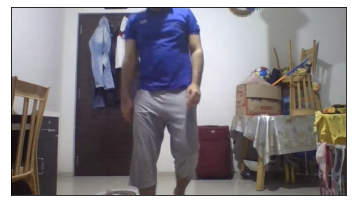

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


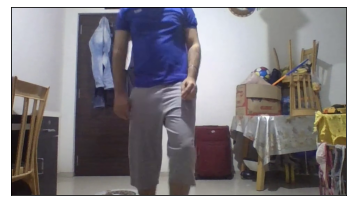

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


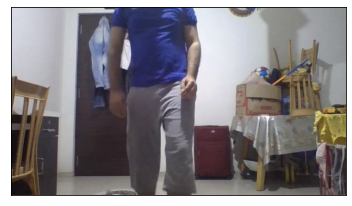

[2] lunges [5] lunges-start
--------------------------------------------------


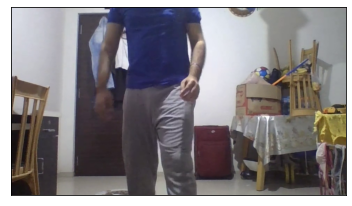

[4] random [7] random-random
--------------------------------------------------
No features
--------------------------------------------------


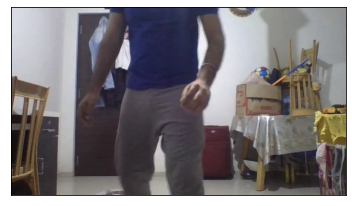

[4] random [7] random-random
--------------------------------------------------


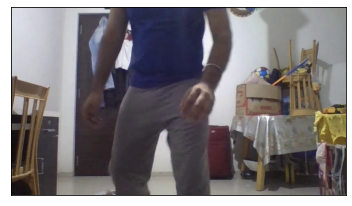

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


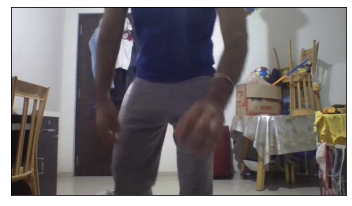

[1] jumping_jacks [3] jumping_jacks-start
--------------------------------------------------


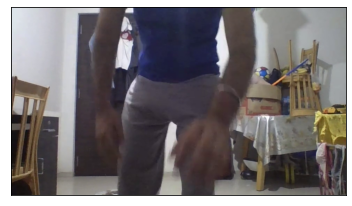

[1] jumping_jacks [5] lunges-start
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------
No features
--------------------------------------------------


In [26]:
for frame in user_frames:
  frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
  feats = _get_frame_features(frame)
  if feats is not None:
    plt.imshow(frame)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    #pred_clas = clf_clas.predict_proba(feats.reshape(1, -1))[0]
    #print([(clas_encoder.inverse_transform([i])[0], round(p, 2)) for i, p in enumerate(pred_clas) if p>0.2])
    #feats = np.hstack((feats, pred_clas.argmax()))
    #pred_subclas = clf_subclas.predict_proba(feats.reshape(1, -1))[0]
    #print([(subclas_encoder.inverse_transform([i])[0], round(p, 2)) for i, p in enumerate(pred_subclas)])
    #print([(subclas_encoder.inverse_transform([i])[0], round(p, 2)) for i, p in enumerate(pred_clas) if p>0.5])
    pred_clas = clf_clas.predict(feats.reshape(1, -1))
    clas_name = clas_encoder.inverse_transform(pred_clas)[0]
    feats = np.hstack((feats, pred_clas))
    pred_subclas = clf_subclas.predict(feats.reshape(1, -1))
    subclas_name = subclas_encoder.inverse_transform(pred_subclas)[0]
    print(pred_clas, clas_name, pred_subclas, subclas_name)
  else:
    print("No features")
  print('-'*50)

In [28]:
subclas_encoder.classes_

array(['crunches-end', 'crunches-start', 'jumping_jacks-end',
       'jumping_jacks-start', 'lunges-end', 'lunges-start',
       'planks-planks', 'random-random', 'squats-end', 'squats-start'],
      dtype=object)

In [29]:
clf_subclas

KNeighborsClassifier(metric='cosine', n_jobs=-1, n_neighbors=3)